- The heart of machine learning is to find the best parameters the gives the minimum prediction error in the training set.
- Cost minimization are the same.
- What are the definitions?
  - MSE, MAE, Loss, minimization, error function?
- How to get the best parameter?


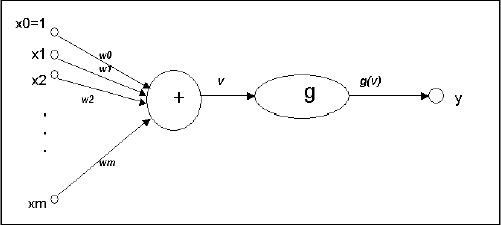

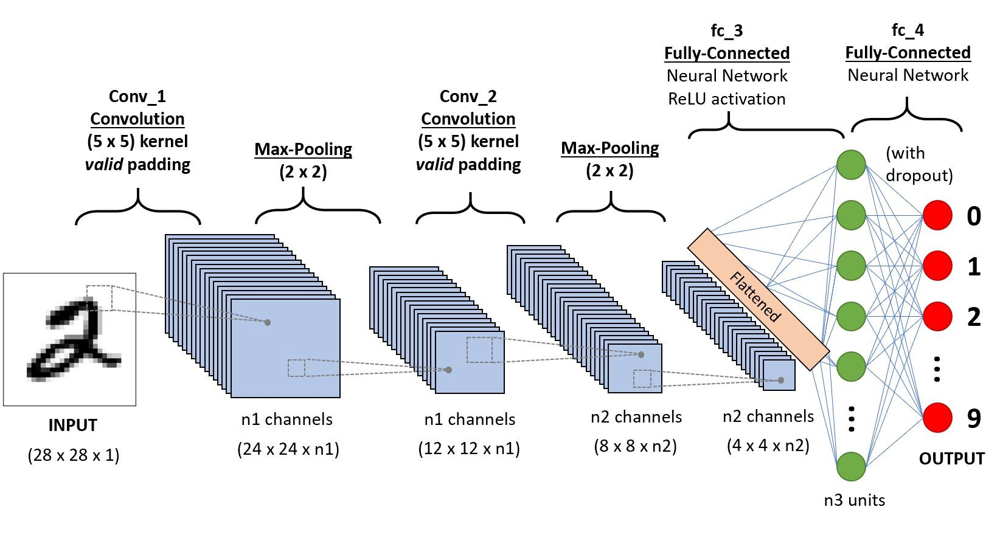

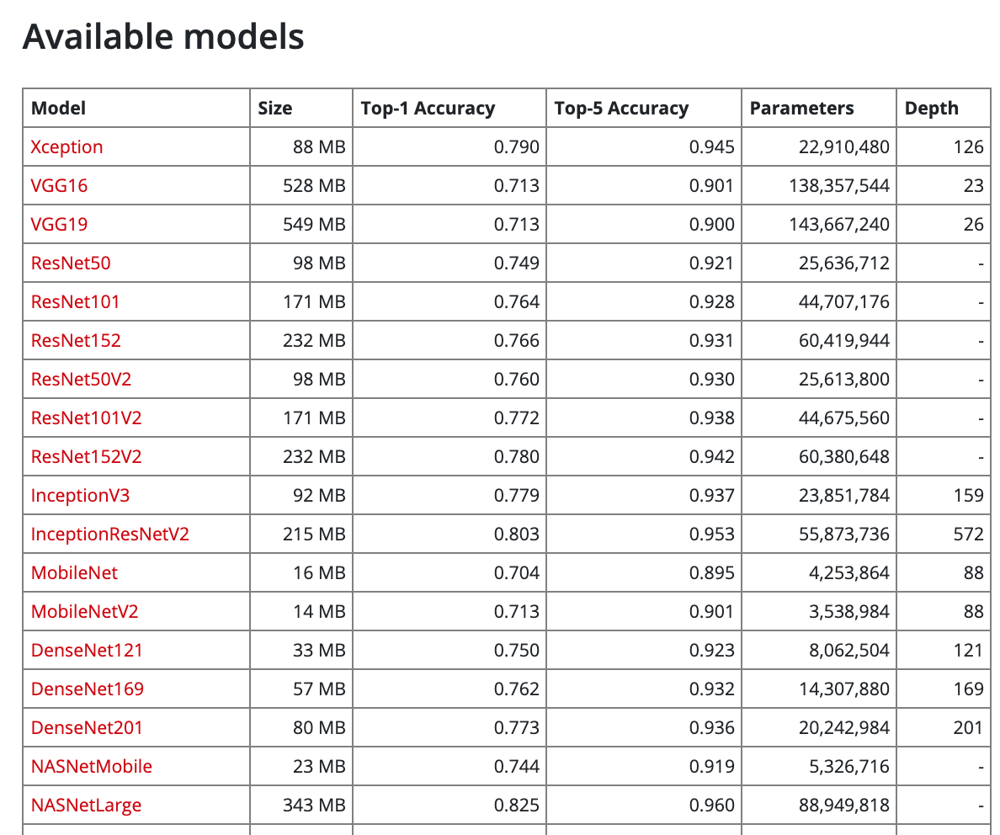

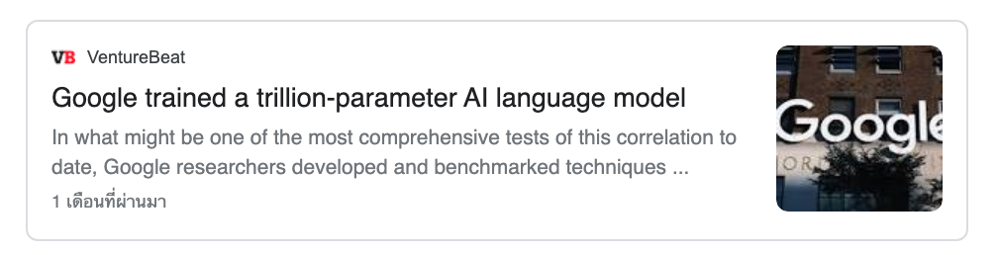

1. Create fake data

In [ ]:
#create fake data
import numpy as np
import pylab as py
N = 100 #number of point
D = 100 #domain from 0 to 100
x = np.random.rand(N) * D #random domain (x is a feature (independent var) e.g. weight) 
y = 2*x #create linear function (y is the output (dependent var) e.g. height)

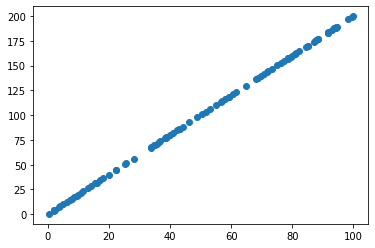

In [ ]:
py.scatter(x,y) #show linear function

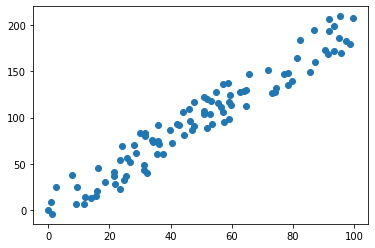

In [ ]:
# create random noise in data
na = 50 #noise amplitude
fakenoise = (np.random.rand(len(y))-0.5)*na #-0.5 to center noise from -0.5 to 0.5 and multiply na
y = y + fakenoise #add noise
py.scatter(x,y) #plot noisy data

2. We created the dataset, we already know the distribution and the parameters of the trend

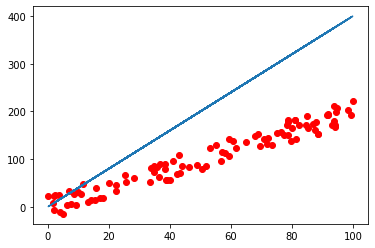

In [ ]:
#create trend line
w = 4
h = w*x #trend line
py.scatter(x,y,c='r') #plot fake data
py.plot(x,h) #plot trend line

3. Error between trend and datapoint (loss)

In [ ]:
import pandas as pd
ydat = pd.DataFrame()
ydat['actual'] = y
ydat['predict'] = h #from trend
ydat['squareerror'] = (y-h)**2
ydat['abserror'] = np.abs(y-h)
ydat

,actual,predict,squareerror,abserror
0,182.128156,315.166575,17699.220887,133.038419
1,68.788091,169.464957,10135.831398,100.676866
2,80.281628,154.262866,5473.223617,73.981238
3,171.435539,376.795456,42172.695788,205.359918
4,153.774268,354.286650,40205.215460,200.512382
...,...,...,...,...
95,156.465899,305.627098,22249.063522,149.161200
96,70.665887,172.658428,10402.478380,101.992541
97,51.273699,102.701115,2644.779075,51.427416
98,50.350124,79.796055,867.062868,29.445931


In [ ]:
res = pd.DataFrame(ydat[['squareerror','abserror']].mean()).T
res.columns = ['meansquareerror','meanabserror'] #mean average all prediction errors i.e. MSE & MAE
res

,meansquareerror,meanabserror
0,14769.635048,105.059224


4. **cost function**

> In reality, we didn't create the data so we do not know the function & parameters. How can we know that the best function is y=2x ...?

4.1 MSE error

In [ ]:
def mse_cal(y,h):
  return np.mean((y-h)**2)

In [ ]:
np.mean((y-h)**2)

14769.635048246651

In [ ]:
mse_cal(y,h)

14769.635048246651

In [ ]:
def mse_error_func(w):
  h = w*x
  return mse_cal(y,h)

In [ ]:
mse_error_func(4)

14769.635048246651

In [ ]:
wList = np.arange(-200,250)/10

In [ ]:
wList

array([-20. , -19.9, -19.8, -19.7, -19.6, -19.5, -19.4, -19.3, -19.2,
       -19.1, -19. , -18.9, -18.8, -18.7, -18.6, -18.5, -18.4, -18.3,
       -18.2, -18.1, -18. , -17.9, -17.8, -17.7, -17.6, -17.5, -17.4,
       -17.3, -17.2, -17.1, -17. , -16.9, -16.8, -16.7, -16.6, -16.5,
       -16.4, -16.3, -16.2, -16.1, -16. , -15.9, -15.8, -15.7, -15.6,
       -15.5, -15.4, -15.3, -15.2, -15.1, -15. , -14.9, -14.8, -14.7,
       -14.6, -14.5, -14.4, -14.3, -14.2, -14.1, -14. , -13.9, -13.8,
       -13.7, -13.6, -13.5, -13.4, -13.3, -13.2, -13.1, -13. , -12.9,
       -12.8, -12.7, -12.6, -12.5, -12.4, -12.3, -12.2, -12.1, -12. ,
       -11.9, -11.8, -11.7, -11.6, -11.5, -11.4, -11.3, -11.2, -11.1,
       -11. , -10.9, -10.8, -10.7, -10.6, -10.5, -10.4, -10.3, -10.2,
       -10.1, -10. ,  -9.9,  -9.8,  -9.7,  -9.6,  -9.5,  -9.4,  -9.3,
        -9.2,  -9.1,  -9. ,  -8.9,  -8.8,  -8.7,  -8.6,  -8.5,  -8.4,
        -8.3,  -8.2,  -8.1,  -8. ,  -7.9,  -7.8,  -7.7,  -7.6,  -7.5,
        -7.4,  -7.3,

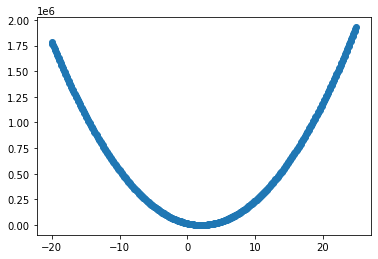

In [ ]:
#plot error against some parameters w
errorList = []
wList = np.arange(-200,250)/10
for w in wList:
  mse = mse_error_func(w)
  errorList.append(mse)
#errorList
py.scatter(wList,errorList)

In [ ]:
w = w - 0.2 * dj/dw

NameError: ignored

In [ ]:
edat = pd.DataFrame()
edat['mse'] = errorList
edat['weight'] = wList
#edat
edat.sort_values(by='mse').head()

,mse,weight
220,223.000728,2.0
221,250.461751,2.1
219,269.210304,1.9
222,351.593374,2.2
218,389.090479,1.8


try MAE error

In [ ]:
def mae_cal(y,h):
  return np.mean(np.abs(y-h))

In [ ]:
mae_cal(y,h)

In [ ]:
def mae_error_func(w):
  h = w*x
  return mae_cal(y,h)

In [ ]:
w = w - alpha * dj/dw

NameError: ignored

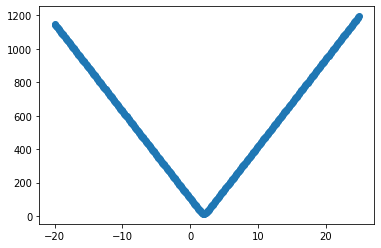

In [ ]:
#plot error against some parameters w
errorList = []
wList = np.arange(-200,250)/10
for w in wList:
  mae = mae_error_func(w)
  errorList.append(mae)
py.scatter(wList,errorList)

In [ ]:
edat = pd.DataFrame()
edat['mae'] = errorList
edat['weight'] = wList
edat.sort_values(by='mae').head()

,mae,weight
220,13.102410,2.0
221,13.509131,2.1
219,14.337701,1.9
222,15.608568,2.2
218,16.603571,1.8


5. In reality, the data is not as simple as in the toy example, with many features and noise, and so the model will be very complecated. To predict an object in an image requires millions or even billions parameters to optimize and so it is impossible to try all combinations of weights. We use gradient descent to help us find the parameters quickly. 

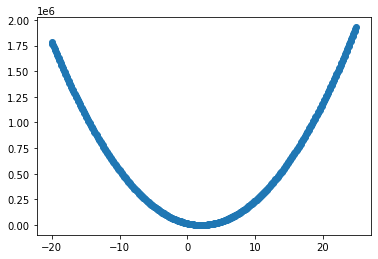

In [ ]:
#plot error against some parameters w
errorList = []
wList = np.arange(-200,250)/10
for w in wList:
  mse = mse_error_func(w)
  errorList.append(mse)
py.scatter(wList,errorList)

In [ ]:
y

array([182.12815638,  68.78809122,  80.28162758, 171.4355388 ,
       153.77426805,  89.22612444,  46.32192724, 177.83326888,
        62.20435912, 129.30190429,  39.11047534,  32.07907052,
       211.87170295, 161.43556392, 222.8998936 , 107.49498161,
       166.56134653, 193.71347848,  32.50317012,  26.59633405,
         9.71045054, 115.77002024, 142.0519078 , 192.76349818,
       190.65405171, 126.80332495,  87.00573465, 181.83896778,
         7.2023053 , 151.27201769, 141.26377079, 142.62190553,
       170.82081467, 207.99171683,  18.48382143, 155.174028  ,
       136.60021883,  -6.68900641, 132.45158716, 165.4432614 ,
       139.11003615, 152.1280761 ,  85.00987538, 171.84910367,
       128.76355471,  67.69440713,  84.95528561,  22.17406649,
       107.95009462, 113.36636873,  55.53577272,  73.70472399,
        60.53406743, 177.69272245, 145.25881892,  96.22287499,
        90.21363426, 172.11624187, 123.8203787 ,  84.29523356,
        18.71224237,  47.55736542,   5.91444274,  14.96

In [ ]:
np.mean((y - 2*x)*x)

46.871380808941005

In [ ]:
mse_error_func(2)

223.00072779829097

In [ ]:
y = sigmoid(2*x1x2x3) + 3*x1x2x3x4 + adfasdf
dy/dx = 4*x + 3  = 0 

Gradient Descent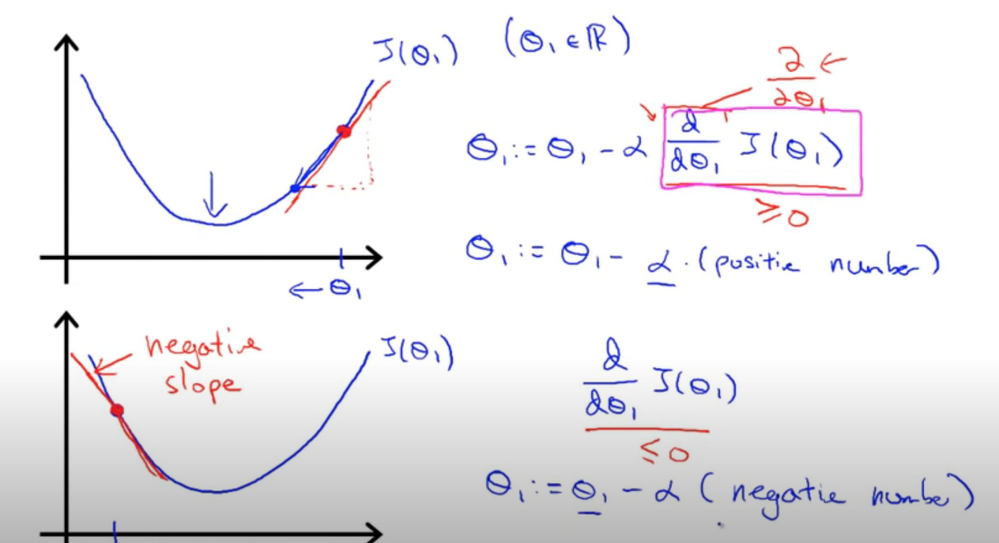

In [ ]:
mse_error_func(100)

35367657.95477483

In [ ]:
np.mean(dC_by_dYH * dYH_by_dW)

NameError: ignored

In [ ]:
#h = w*x
dj_by_dw = (h-y)*x
np.mean(dj_by_dw)

7320.188541033122

In [ ]:
w = 100 #initilize weight
err = mse_error_func(w)
alpha = 0.0001 #learning rate
iter = 100
wList = [w]
eList = [err]
err

35367657.95477483

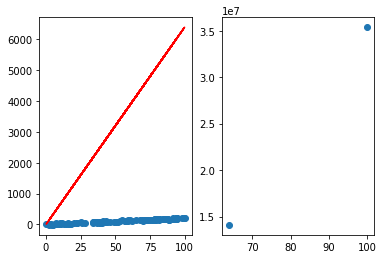

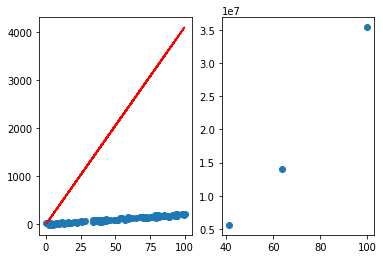

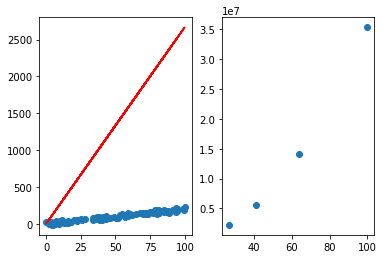

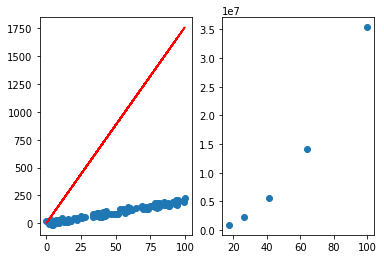

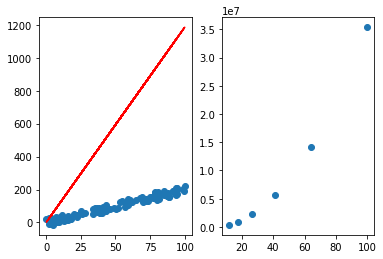

...

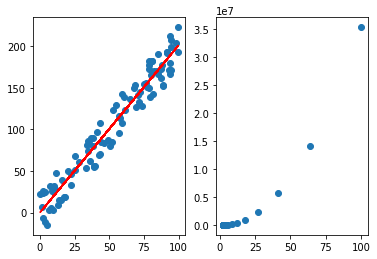

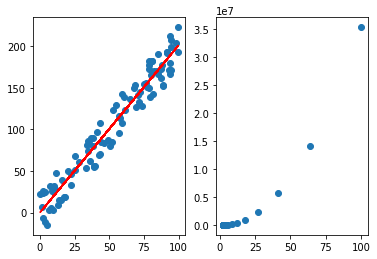

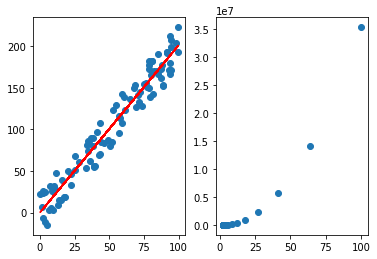

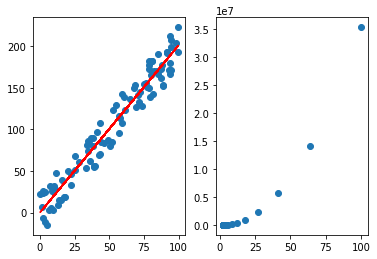

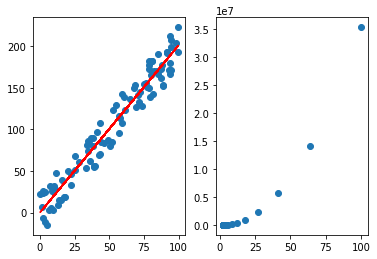

In [ ]:
#def trainmodel():
for i in range(iter):
  h = w * x
  #j = 1/2 * (y - h)**2

  #dj_by_dw = dj_by_dh * dh_by_dw

  dj_by_dh = h - y
  
  dh_by_dw = x
  dj_by_dw = np.mean((h - y) * x)



  w = w - alpha * dj_by_dw
  #print(w)
  err = mse_error_func(w)
  #print(w)
  #print(err)

  fig, (ax1, ax2) = py.subplots(1, 2)
  eList.append(err)
  wList.append(w)
  ax1.scatter(x, y)
  ax1.plot(x,x*w,c='r')
  ax2.scatter(wList, eList)
  py.show()
    #input()

In [ ]:
err

In [ ]:
py.scatter(x,y+50)

NameError: ignored

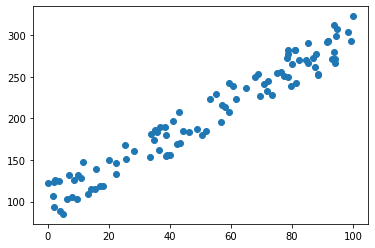

In [ ]:
y = y + 50
py.scatter(x,y)
h = w*x + b
#dj_by_dw = dj_by_dh * dh_by_dw
dj_by_dh = h-y
dh_by_dw = x
dj_by_dw = dj_by_dh * dh_by_dw
dj_by_db = h-y



In [ ]:
def mse_error_func(w,b):
  h = w*x + b
  return mse_cal(y,h)

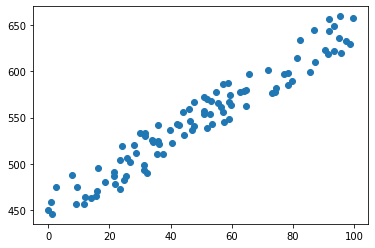

In [ ]:
y = y + 450
py.scatter(x,y)

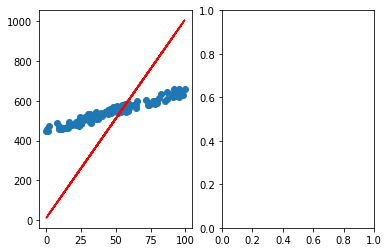

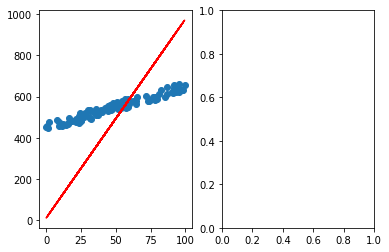

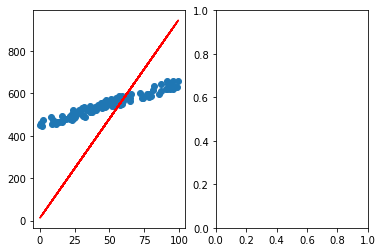

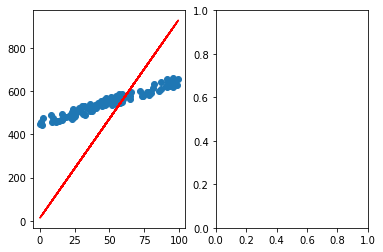

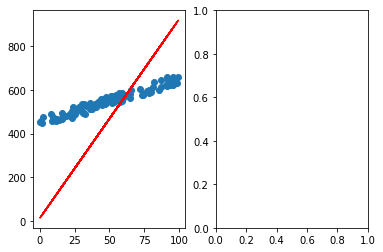

...

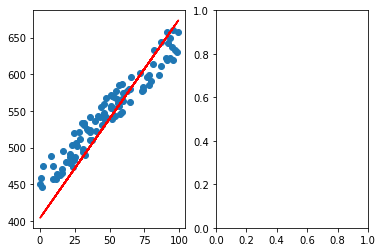

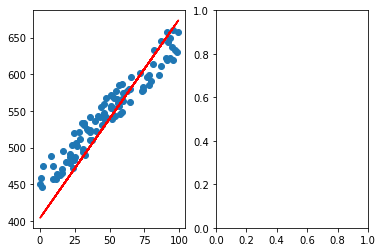

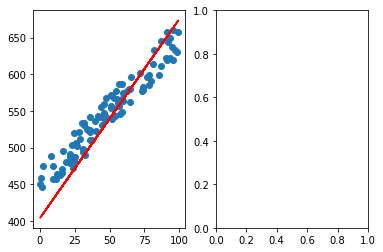

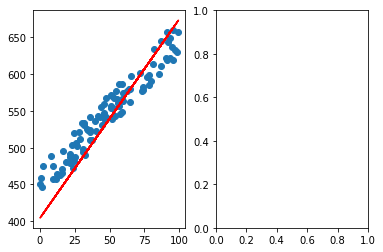

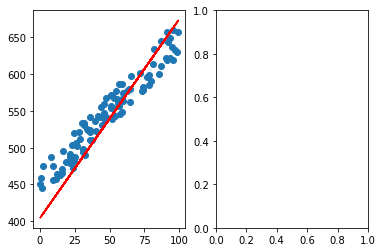

In [ ]:
trainmod()

In [ ]:
def trainmod():
  w = 10 #initilize weight
  b = 10
  err = mse_error_func(w,b)
  walpha = 0.0001 #learning rate
  balpha = 0.01
  iter = 1000
  wList = [w]
  eList = [err]
  for i in range(iter):
    h = w*x + b
    #costFunc = 1/2 * (y - yh)**2
    #costFunc = 1/2 * (y - w*x)**2
    dj_by_dh = h-y
    dh_by_dw = x
    dj_by_dw = dj_by_dh * dh_by_dw
    dj_by_db = h-y


    dj_by_dw = np.mean(dj_by_dw)
    dj_by_db = np.mean(dj_by_db)
    
    w = w - walpha * dj_by_dw
    b = b - balpha * dj_by_db
    #print(b)
    err = mse_error_func(w,b)
    #return x

    fig, (ax1, ax2) = py.subplots(1, 2)
    #fig.suptitle('Horizontally stacked subplots')
    eList.append(err)
    wList.append(w)
    ax1.scatter(x, y)
    ax1.plot(x,h,c='r')
    #ax2.scatter(wList, eList)
    #ax2.plot(x,x*w,c='r')

    #py.scatter(x,y)
    #py.plot(x,x*w,c='r')
    #py.title('MSE : %s'%err)
    py.show()
    #input()